# Getting Started

The goal of this notebook is to take a basic look at a tag that was on an Atlantic Bluefin Tuna that was captured off the coast of Florida last summer. Furthermore, we will look into loading part of the data set that we will be working with so that we can get experience running experiments in parallel.  

In the first part of this notebook, we are going to do the following: 
1. segment the tag deployment into a series of dives
2. look at how many measurements we get on those dives, and try create a criteria for dive thresholds that make the historgram of dive lengths more like a normal distribution, and not with huge tails on the histogram


# Part 1


In [71]:
import tagStruct
import matplotlib.pyplot as plt
import math
import numpy as np








Here is where we are going to load the tag data set. This should be a common call that we will do on all tag deployments. 

The colNames vector that you pass in for tag.readcsv should be the exact column names that we are interested in in the csv that is held in filePath.

In [72]:
filePath = "data/Robbie2018Tag.csv"
tag = tagStruct.Tag(filePath)
colNames = ['Time', 'Depth', 'Temperature', 'Light Level']
tag.readcsv(colNames)

data/Robbie2018Tag.csv
['time', 'depth', 'temperature', 'light level']
found:  time


## A first approximation

Here, we are going to define a dive as the interval between a fish going below 5 meters of depths and when it finally gets above 5 meters of depth. 

In [73]:
tagDf = tag.getDives(5)

Here, we will define a simple function to plot a histogram for us with 30 buckets. 

In [74]:
def plotLengths(diveVec, threshold):
    lengths = [len(diveVec[i]) for i in range(0, len(diveVec))]
    buckets = np.linspace(math.ceil(min(lengths)), math.floor(max(lengths)), 50)
    print("The max dive length was: ", max(lengths))
    plt.hist(lengths, bins = buckets)
    plt.title("Distribution of dive lengths in timevat dive threshold: " + str(threshold))
    plt.xlabel("Number of measurements taken during dive")
    plt.ylabel("Frequency")
    plt.show()

The max dive length was:  11529


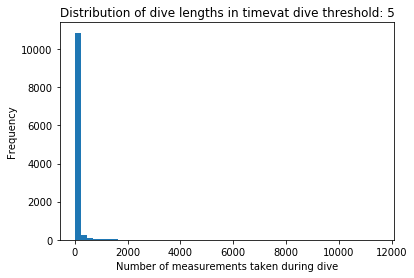

In [75]:
plotLengths(tagDf, 5)

This histogram is not the best. The heavy tails and a huge number near 0 mean that a lot of the dives that are over-segmented. Let's try a bunch of values for the threshold -- from 5 to 100 meters. 

In [76]:
def lookAtManyDepths(tag, silence = False):
    potentDepths = np.linspace(5, 100, 30)
    numberOfDives = list()
    for tempDepthThreshold in potentDepths:
        tempDives = tag.getDives(tempDepthThreshold)
        if not silence: plotLengths(tempDives, tempDepthThreshold)
        numberOfDives.append(len(tempDives))
    return numberOfDives

The max dive length was:  11529


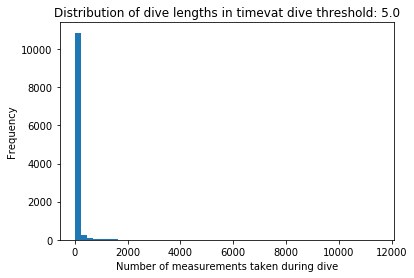

The max dive length was:  10816


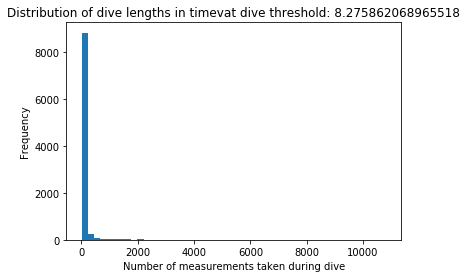

The max dive length was:  9790


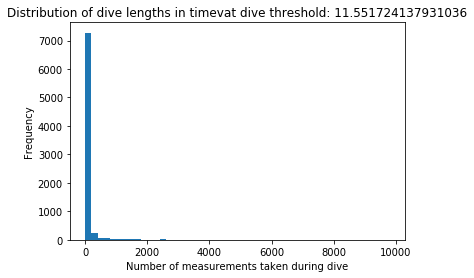

The max dive length was:  6708


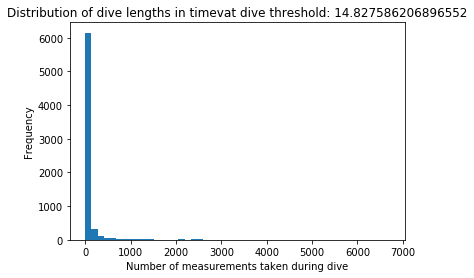

The max dive length was:  6707


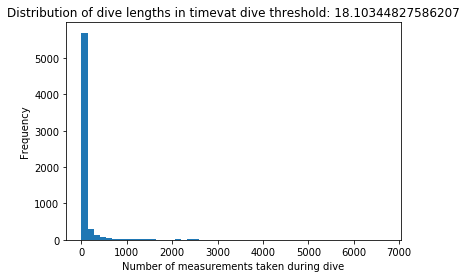

The max dive length was:  6706


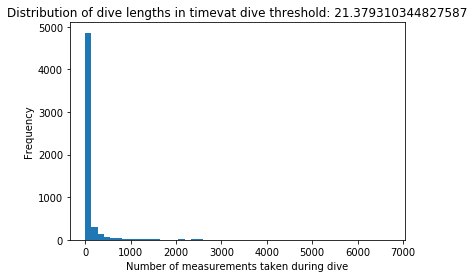

The max dive length was:  6706


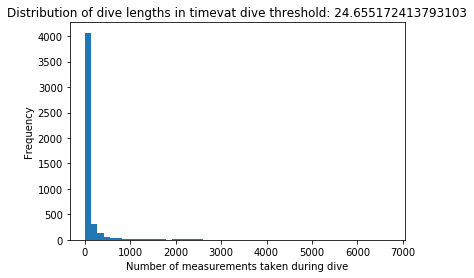

The max dive length was:  5688


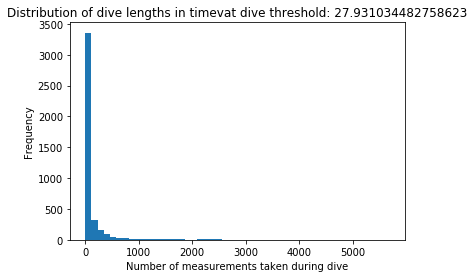

The max dive length was:  5685


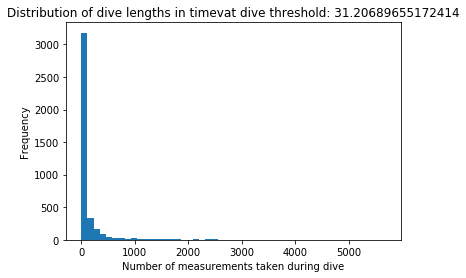

The max dive length was:  5549


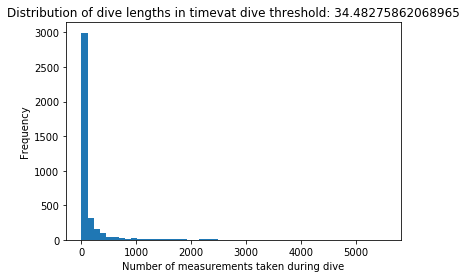

The max dive length was:  5327


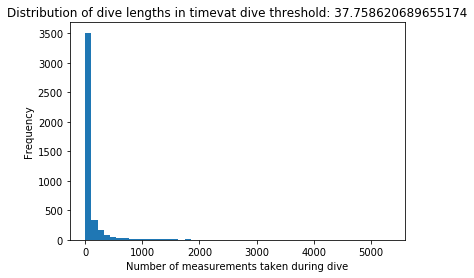

The max dive length was:  5327


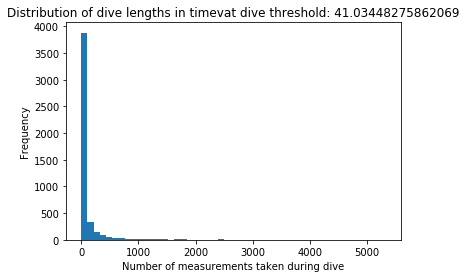

The max dive length was:  5327


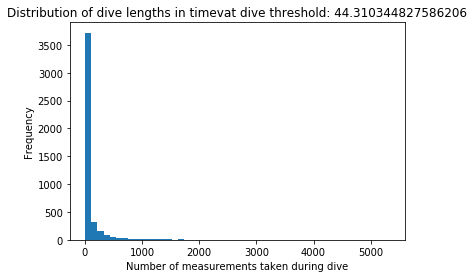

The max dive length was:  5327


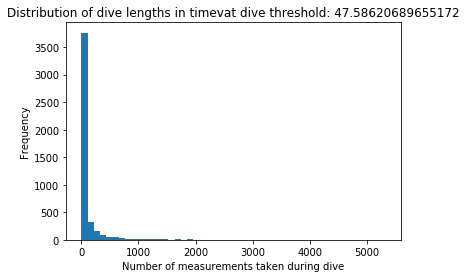

The max dive length was:  5325


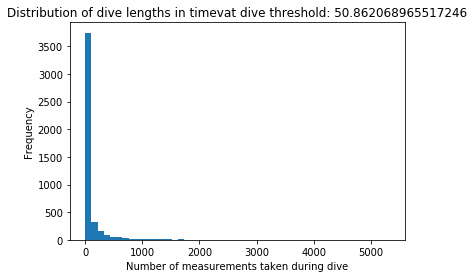

The max dive length was:  5325


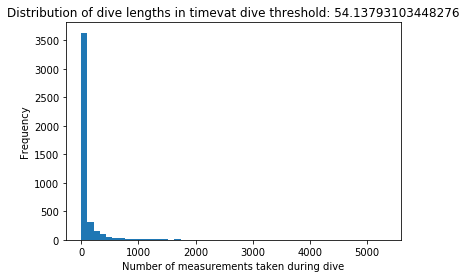

The max dive length was:  5325


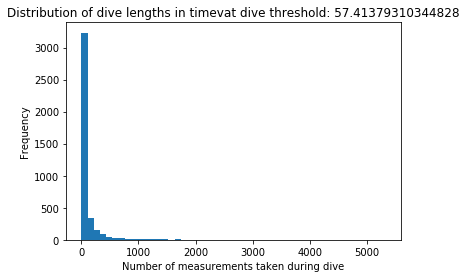

The max dive length was:  5325


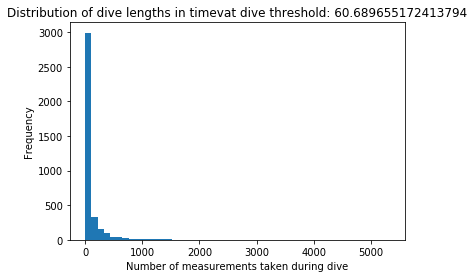

The max dive length was:  5323


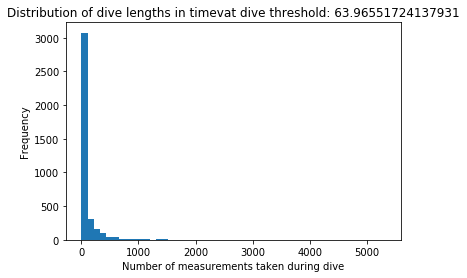

The max dive length was:  5323


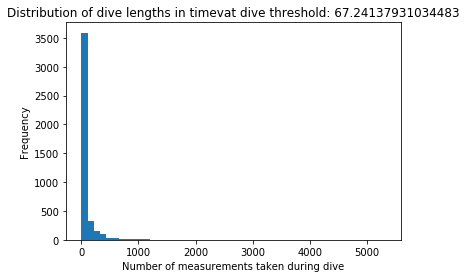

The max dive length was:  5322


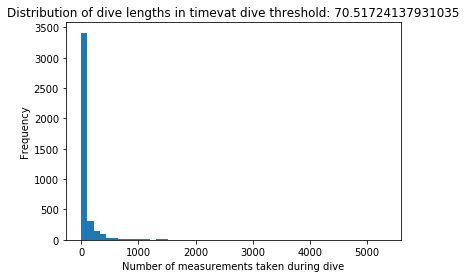

The max dive length was:  5321


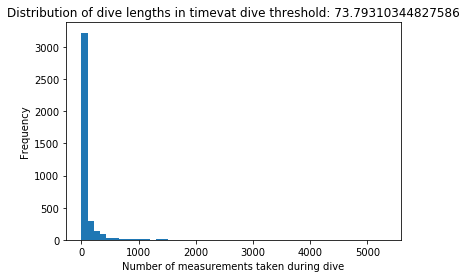

The max dive length was:  5321


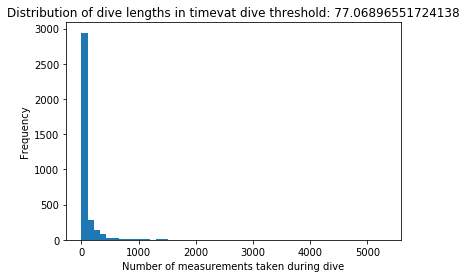

The max dive length was:  5321


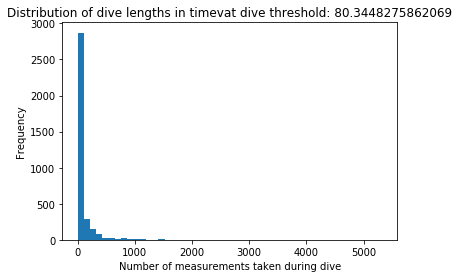

The max dive length was:  5320


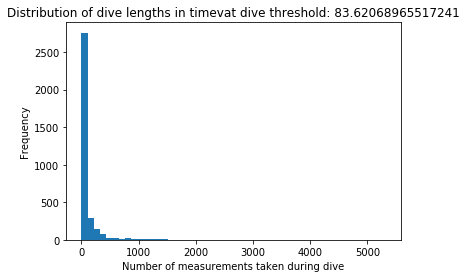

The max dive length was:  5320


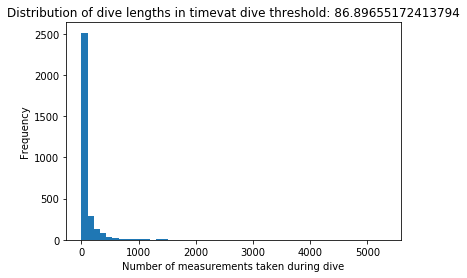

The max dive length was:  5319


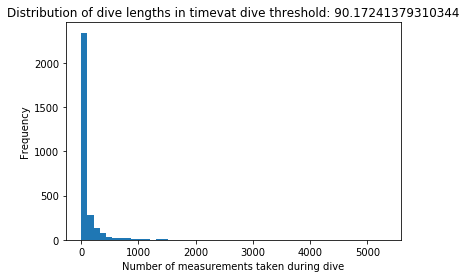

The max dive length was:  5318


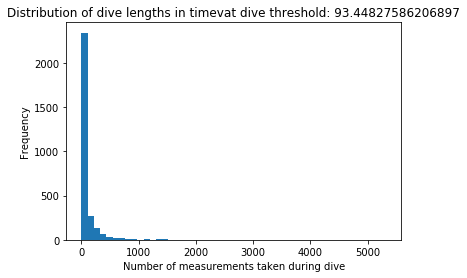

The max dive length was:  5318


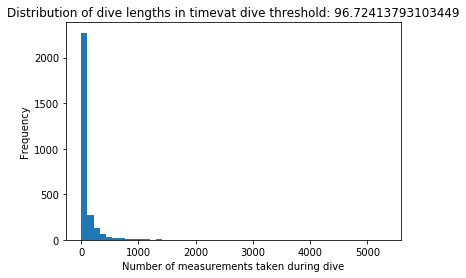

The max dive length was:  5318


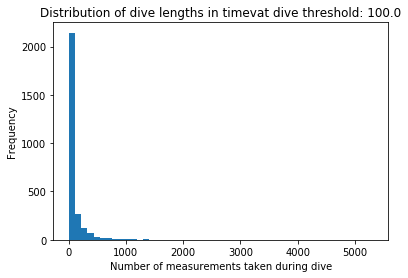

In [77]:
listOfDiveVolumes = lookAtManyDepths(tag)

Text(0, 0.5, 'Dive Volume')

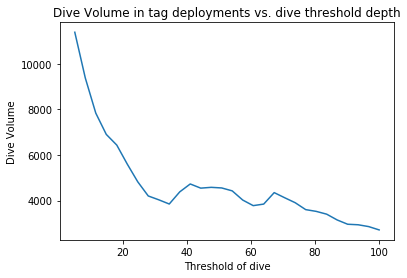

In [78]:
plt.plot(np.linspace(5, 100, 30), np.asarray(listOfDiveVolumes))
plt.title("Dive Volume in tag deployments vs. dive threshold depth")
plt.xlabel("Threshold of dive")
plt.ylabel("Dive Volume")

It looks like the threshold of roughly 30 meters is where a lot of the action is occuring. The dive volume seems pretty stable here


Why would we select 30? Seems like an intuive thing looking at the graph, but a better english description for the writeup would be better. 


# Does this threshold work for other individuals of tuna?

Here, we will do the following: 
1. Create a function that loads all the data, and returns an array of tag instances for each dataset
2. Runs the exact analysis we did on the last fish
3. Look at the last figure and see what's up

In [79]:
datasets = [#"5103535LO01A532TS.csv", 
        #"5109026MA0109A0355TS.csv", 
        "5111027PAM110P0574TS.csv", 
        "5111033PAM110P0587-Archive.csv",
        "5111034PAM110P0588-Archive.csv", 
        "5111045PAM110P0590-Archive.csv", 
        "5112030PAM110P0416-Archive.csv", 
        "5112039PAM111P0762-Archive.csv", 
        "5112041PAM111P0763-Archive.csv"]

In [80]:
dataSetColNames = [
                    #["Time (UTC)","Depth - dBar","Light at Depth","Int Temp deg C","Ext Temp deg C"],
                    #["Date","Time","Depth","Internal Temperature","External Temperature","Light Level"],
                    ["Time","Depth","Temperature","Light Level"], 
                    ["Time","Depth","Temperature","Light Level"],
                    ["Time","Depth","Temperature","Light Level"], 
                    ["Time","Depth","Temperature","Light Level"], 
                    ["Time","Depth","Temperature","Light Level"],
                    ["Time","Depth","Temperature","Light Level"], 
                    ["Time","Depth","Temperature","Light Level"]
                  ]
                   

In [81]:
def loadDatasets():
    tags = []
    for i in range(0, len(datasets)):
        path = "data/" + datasets[i]
        colNames = dataSetColNames[i]
        tag = tagStruct.Tag(path)
        tag.readcsv(colNames)
        tags.append(tag)
    return tags



In [82]:
tags = loadDatasets()

data/5111027PAM110P0574TS.csv
['time', 'depth', 'temperature', 'light level']
found:  time
data/5111033PAM110P0587-Archive.csv
['time', 'depth', 'temperature', 'light level']
found:  time
data/5111034PAM110P0588-Archive.csv
['time', 'depth', 'temperature', 'light level']
found:  time
data/5111045PAM110P0590-Archive.csv
['time', 'depth', 'temperature', 'light level']
found:  time
data/5112030PAM110P0416-Archive.csv
['time', 'depth', 'temperature', 'light level']
found:  time
data/5112039PAM111P0762-Archive.csv
['time', 'depth', 'temperature', 'light level']
found:  time
data/5112041PAM111P0763-Archive.csv
['time', 'depth', 'temperature', 'light level']
found:  time


In [83]:
def lookAtThresholds(tags):
    for i in range(0, len(tags)):
        tag = tags[i]
        listOfDiveVolumes = lookAtManyDepths(tag, silence = True)
        plt.plot(np.linspace(5, 100, 30), np.asarray(listOfDiveVolumes))
        plt.title("Dive Volume in tag deployments vs. dive threshold depth. Dataset id: " + str(tag.getName()))
        plt.xlabel("Threshold of dive")
        plt.ylabel("Dive Volume")
        plt.show()


data/5111027PAM110P0574TS.csv


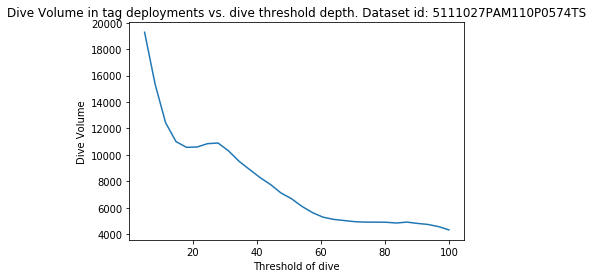

data/5111033PAM110P0587-Archive.csv


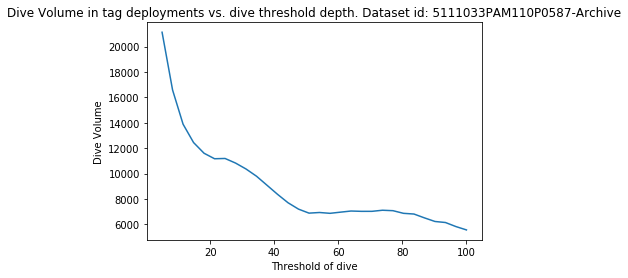

data/5111034PAM110P0588-Archive.csv


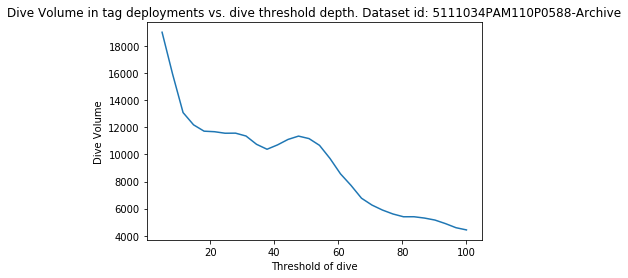

data/5111045PAM110P0590-Archive.csv


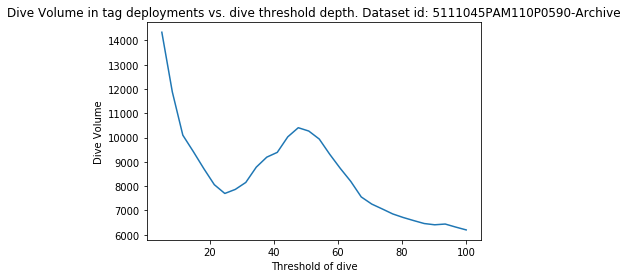

data/5112030PAM110P0416-Archive.csv


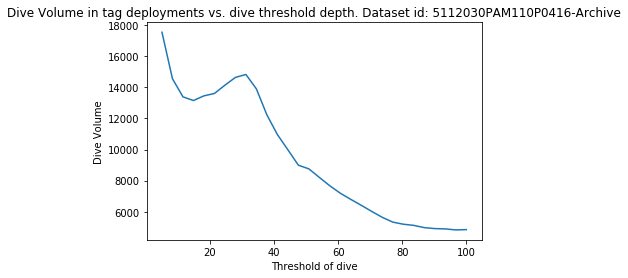

data/5112039PAM111P0762-Archive.csv


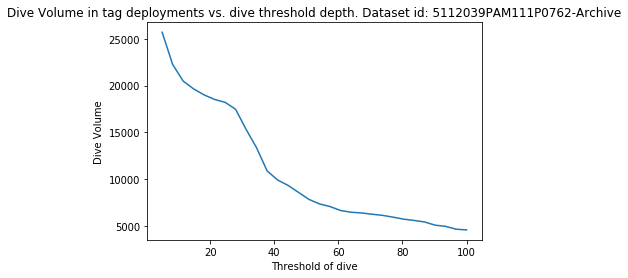

data/5112041PAM111P0763-Archive.csv


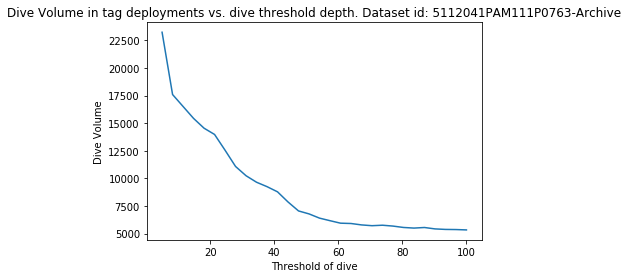

In [84]:
lookAtThresholds(tags)

While most of the tags have a threshold at around 25-30 m that would do pretty good, on some of the deployments the number of dives goes up when we use a threshold of roughly 40-60 m. This may indicate that 2 thresholds may be capturing two regimes of behavior. 

Another idea may be that this large threshold is segmenting rapid occiilatory dives that are around this depth. Let's see if that is the case. The tags that had this hump are 416, 590, and 588. 

Let's look at the length of the dives throughout the time of the deployment when we use a depth threshold of 35 and 50 to see if there is anything special going on on these 3 deployments with the humps around 30-50m as a threshold. 

In [85]:
def lookAtDiveLengths(tags):
    thresholds = [35, 50]
    for i in range(len(tags)):
        for j in range(0, len(thresholds)):
            tag = tags[i]
            dives = tag.getDives(thresholds[j])
            diveSizes = [len(dives[k]) for k in range(0, len(dives))]
            plt.plot(np.asarray(diveSizes))
            plt.title("Length of dives. Tag id: " + str(tag.getName()) + "Threshold: " + str(thresholds[j]))
            plt.xlabel("dive number")
            plt.ylabel("length")
            plt.show()    

data/5111027PAM110P0574TS.csv


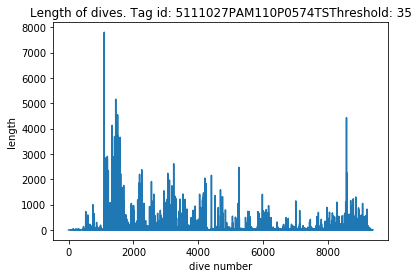

data/5111027PAM110P0574TS.csv


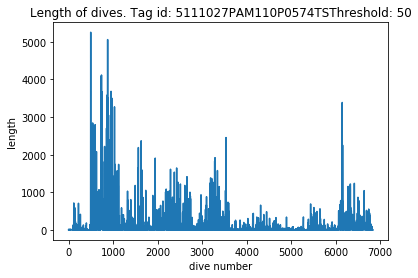

data/5111033PAM110P0587-Archive.csv


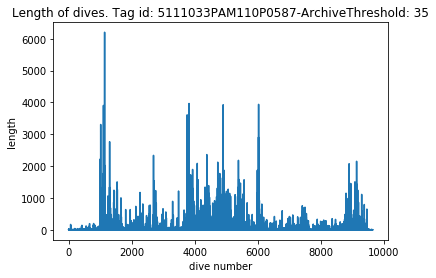

data/5111033PAM110P0587-Archive.csv


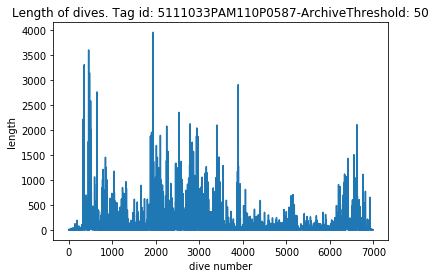

data/5111034PAM110P0588-Archive.csv


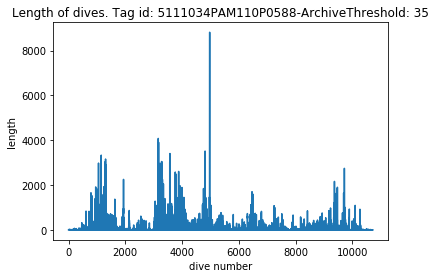

data/5111034PAM110P0588-Archive.csv


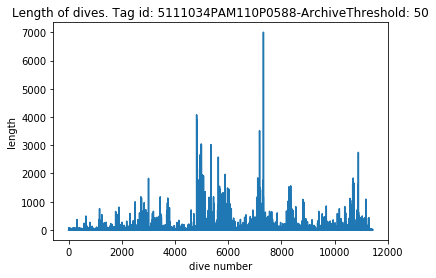

data/5111045PAM110P0590-Archive.csv


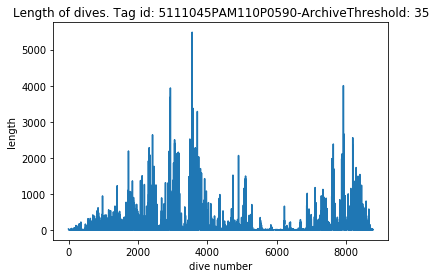

data/5111045PAM110P0590-Archive.csv


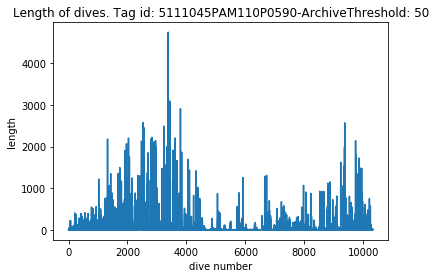

data/5112030PAM110P0416-Archive.csv


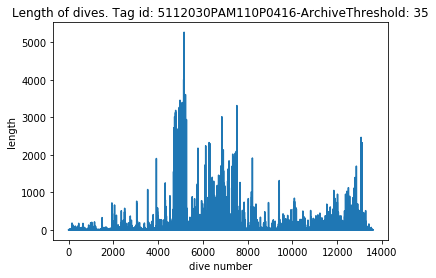

data/5112030PAM110P0416-Archive.csv


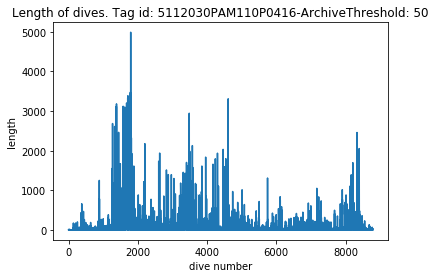

data/5112039PAM111P0762-Archive.csv


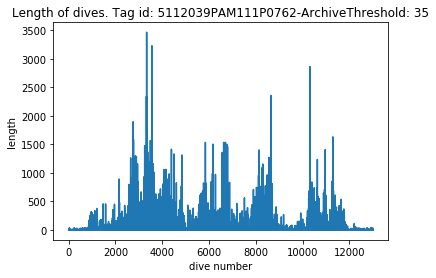

data/5112039PAM111P0762-Archive.csv


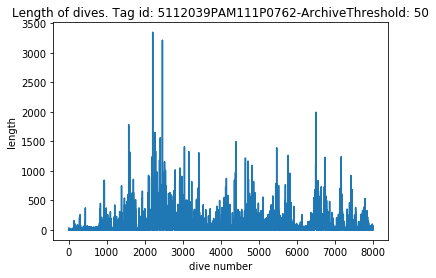

data/5112041PAM111P0763-Archive.csv


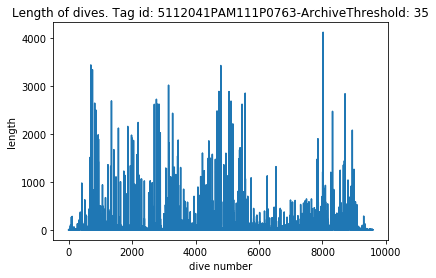

data/5112041PAM111P0763-Archive.csv


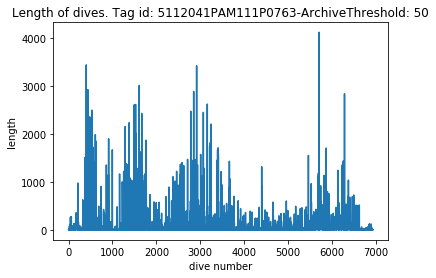

In [86]:
lookAtDiveLengths(tags)

Notes:
The key to looking at this plot is finding a linear translation of the spectrum of lengths between 35 and 50 as the thresholds. 
1. 588 (hump at 50) has a lot of dives added at the beginning of the deployment. Not a whole lot of dives at the 30 m threshold are split up with a 50 meter threshold near the end of the deployment. 
2. 590 (hump at 50) has dives segmented at the middle of the deployment through a 50m threshold.
3. 416 (hump at 30) has a lot of dives segmented in the beginning of the deployment. 

To get an exact idea, let's plot the whole dataset for each of these deployments.

In [87]:
troublesomeTags  = tags[2:5]

In [88]:
print([tag.getName() for tag in troublesomeTags])

data/5111034PAM110P0588-Archive.csv
data/5111045PAM110P0590-Archive.csv
data/5112030PAM110P0416-Archive.csv
['5111034PAM110P0588-Archive', '5111045PAM110P0590-Archive', '5112030PAM110P0416-Archive']


In [89]:
def plotDepths(tags):
    for i in range(0, len(tags)):
        tag = tags[i]
        depthChannel = tag.findIndex("depth")
        depthTimeSeries = tag.__raw__.values[:, depthChannel]
        plt.plot(depthTimeSeries)
        plt.title("Entire tag deployment of: " + str(tag.getName()))
        plt.xlabel("time")
        plt.ylabel("depth (m)")
        plt.gca().invert_yaxis()
        plt.axhline(y=30, color='r')
        plt.axhline(y=50, color='r')
        plt.plot()
        plt.show()

data/5111034PAM110P0588-Archive.csv


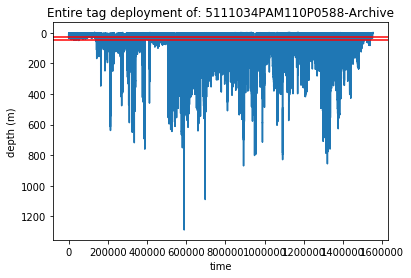

data/5111045PAM110P0590-Archive.csv


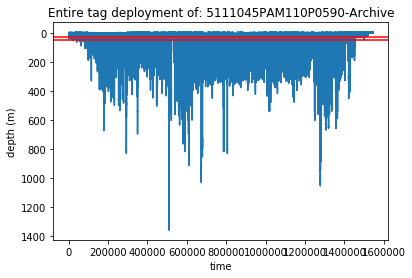

data/5112030PAM110P0416-Archive.csv


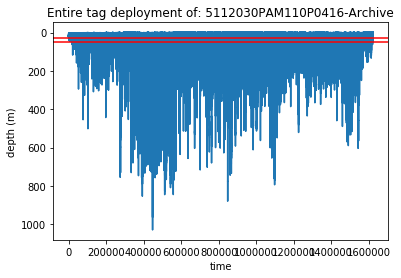

In [90]:
plotDepths(troublesomeTags)

## This looks like shit. Let's do the log of depth. 

In [91]:
def plotDepthsLog(tags):
    for i in range(0, len(tags)):
        tag = tags[i]
        depthChannel = tag.findIndex("depth")
        depthTimeSeries = tag.__raw__.values[:, depthChannel]
        depthTimeSeries = np.asarray([np.log(depthTimeSeries[i]) for i in range(0, len(depthTimeSeries))])
        plt.plot(depthTimeSeries[1::100])
        plt.title("Entire tag deployment of: " + str(tag.getName()))
        plt.xlabel("time")
        plt.ylabel("depth (m)")
        plt.gca().invert_yaxis()
        plt.axhline(y=np.log(30), color='r')
        plt.axhline(y=np.log(50), color='r')
        plt.plot()
        plt.show()

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in log
  


data/5111027PAM110P0574TS.csv


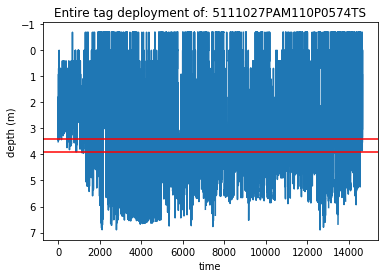

data/5111033PAM110P0587-Archive.csv


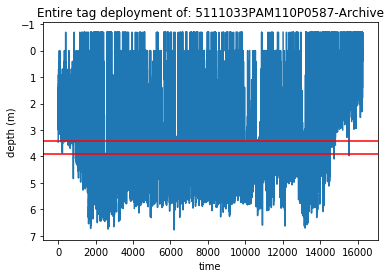

data/5111034PAM110P0588-Archive.csv


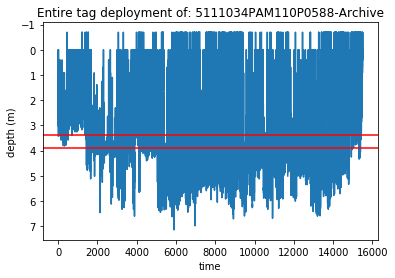

data/5111045PAM110P0590-Archive.csv


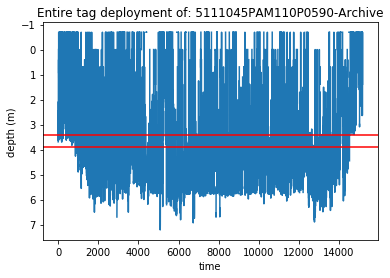

data/5112030PAM110P0416-Archive.csv


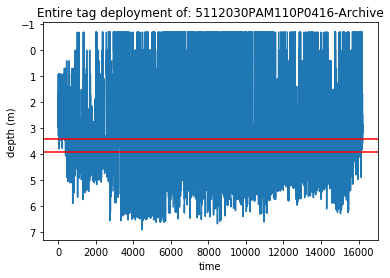

data/5112039PAM111P0762-Archive.csv


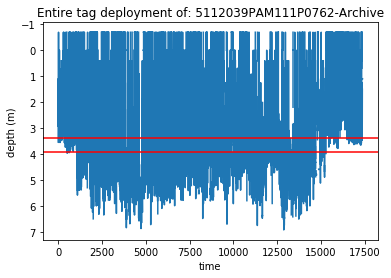

data/5112041PAM111P0763-Archive.csv


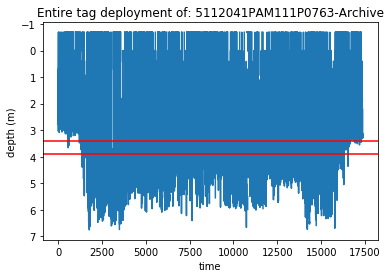

In [92]:
plotDepthsLog(tags)

I don't really know how to interpret this. Since there are no data sets taht are improperly segmented with a 30m threshold, let's just stick to that. 

In [93]:
def loadDives(tags, threshold):
    return [tags[i].getDives(threshold) for i in range(0, len(tags))]
   

In [94]:
divesForDataset = loadDives(tags, 30)

Now that we just created a threshold, what should be the minimum-length dive? Let's see how many dives we lose by putting various restrictions on how long a dive has to be. 

In [95]:
def plotLossOfDives(tags):
    potentMins = np.linspace(100, 1000, 20)
    for i in range(0, len(divesForDataset)):
        listOfSizes = []
        tempDataset = divesForDataset[i]
        for j in range(0, len(potentMins)):
            tempDataset = [tempDataset[k] for k in range(0, len(tempDataset)) if len(tempDataset[k]) > potentMins[j]]
            listOfSizes.append(len(tempDataset))
        plt.plot(potentMins, listOfSizes)
        plt.title("Size of dataset after truncation by length of dives")
        plt.xlabel("Required size of dive")
        plt.ylabel("Dataset size")
        plt.show()

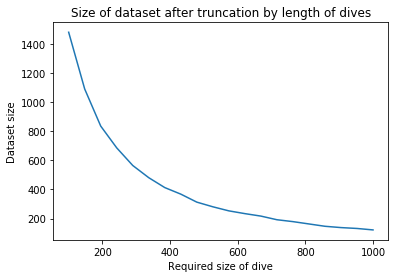

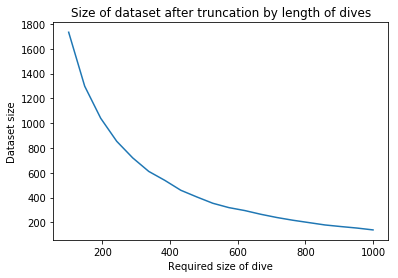

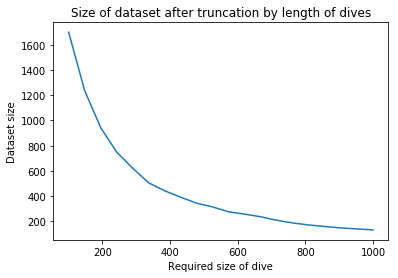

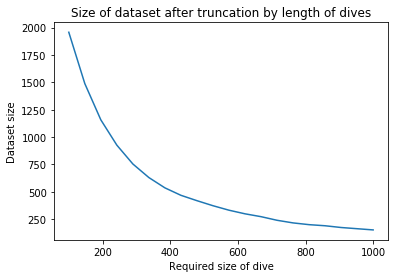

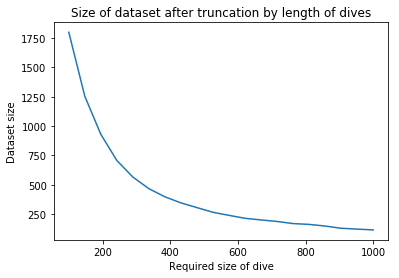

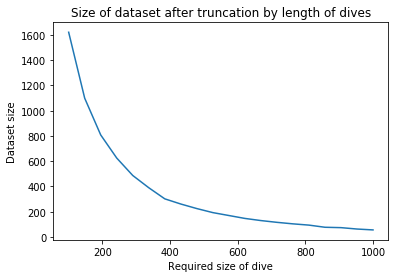

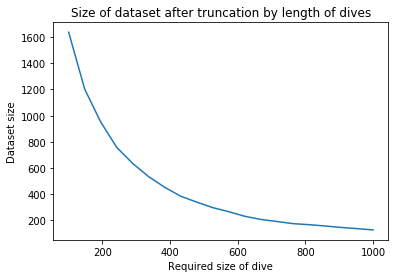

In [96]:
plotLossOfDives(tags)

Let's take the minimum length to be 200. Looks like it will result in consistent data set size.

In [97]:
def truncateDives(tags, minLength):
    for i in range(0, len(tags)):
        tag = tags[i]
        dives = tag.dives
        dives = [dives[k] for k in range(0, len(dives)) if len(dives[k]) > minLength]
        tag.dives = dives
    return tags

In [98]:
loadDives(tags, 30)  
tags = truncateDives(tags, 200)

# Part 2

So we have just segmented the dives. Next, we are going to use the featureizer that is in tagStruct.py to create constant-length representations of the dives. 

## The four approaches that we are going to take are: 

1. cosine distance with count matrix 
2. cosine distance with pca'd count matrix (but we first have to look at how many components to take)
3. Jensen-shannon distance with the normalized matrix
4. jensen-shannon distance with the pca'd normalized matrix

Here, we are just going to fool around with just one tag so that we can get a feel for the process. 

In [99]:
## Get count matrix representation for each dive.
tempTag = tags[0]
countReps = tempTag.createCounts()

Let's get a sense of how much we can reduce the dimensioality of the count matrices. 

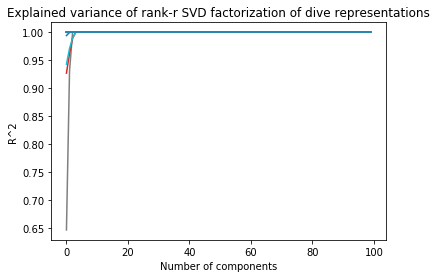

In [100]:
from sklearn.decomposition import PCA
for i in range(0, len(countReps)):
    diveRep = countReps[i]
    pca = PCA()
    decomp = pca.fit(diveRep)
    varExplained = np.cumsum(decomp.explained_variance_ratio_)
    plt.plot(varExplained)
plt.title("Explained variance of rank-r SVD factorization of dive representations")
plt.xlabel("Number of components")
plt.ylabel("R^2")
plt.show()

Let's see if there is a nice elbow point on the magnitude of the singular values. 

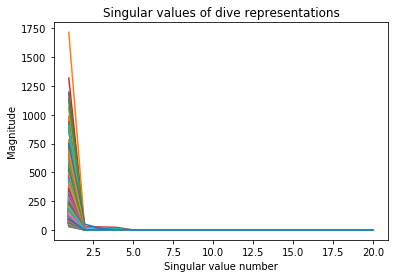

In [101]:
for i in range(0, len(countReps)):
    diveRep = countReps[i]
    u, s, vh = np.linalg.svd(diveRep, full_matrices=True)
    plt.plot(range(1,21), s[:20])
plt.title("Singular values of dive representations")
plt.xlabel("Singular value number")
plt.ylabel("Magnitude")
plt.show()    

Jesus christ, this is a sharp point. Using this criteria, it looks like a rank-10 factorization will do the job just fine. However, the $R^2$ of the principal components tell a completely different story. 

To comprimise, let's just look at all rank-r factorizations from 10 to 100 (full rank). 

Here's a quick function to factorize our representations with the rank parameter:

In [102]:
from sklearn.decomposition import PCA
def reduceCountsSVD(countReps, numComponents):
    pca = PCA()
    decomp = pca.fit(countReps)
    firstXLoadings = decomp.components_[:numComponents, :]
    reduced_x = countReps.dot(firstXLoadings.T)
    return reduced_x, decomp

Ok, so we have a factorizations of the pure count matrices as well as the count matrices themselves. Let's take a look at how this affects to dissimilarity matrices. 

First, let's turn the list into a matrix such that row i in the matrix is index i in the list. To get it into a matrix, let's simply flatten the count matrix.

In [153]:
import scipy.spatial.distance
def matrixify(countReps):
    numSamples = len(countReps)
    columnNum = np.ndarray.flatten(countReps[0]).shape[0]
    matrixRep = np.zeros((numSamples, columnNum))
    for i in range(0, len(countReps)):
        matrixRep[i, :] = np.ndarray.flatten(countReps[i])
    return matrixRep
                
def createDissim(countReps, reduce = False, numComponents = 0):
    sampleMatrix = matrixify(countReps)
    decomp = "str"
    if reduce:
        sampleMatrix, decomp = reduceCountsSVD(sampleMatrix, numComponents)
    if numComponents == 2: 
        plt.plot(decomp.singular_values_[:100])
        plt.plot(decomp.singular_values_[:100] + 100)
        plt.title("Singular values")
        plt.xlabel("singular value number")
        plt.ylabel("Magnitude")
        plt.show()
    dissimMatrix =  scipy.spatial.distance.pdist(sampleMatrix, 'cosine')
    dissimMatrix = scipy.spatial.distance.squareform(dissimMatrix)
    return dissimMatrix      

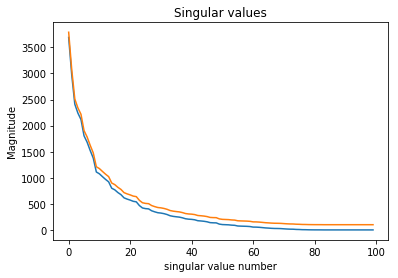

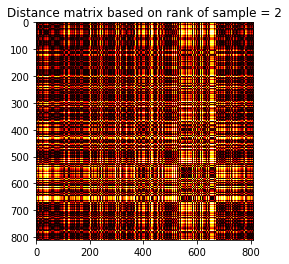

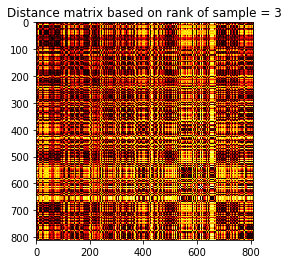

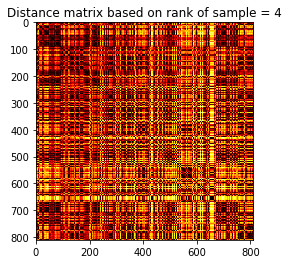

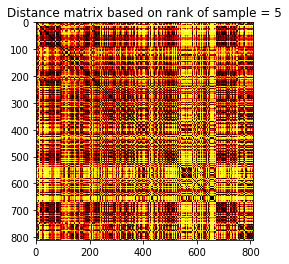

...

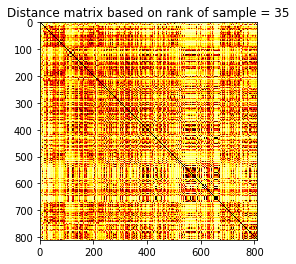

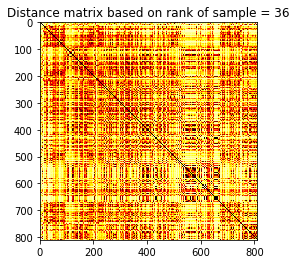

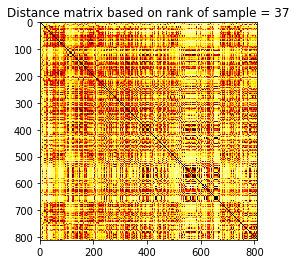

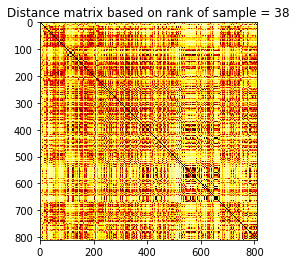

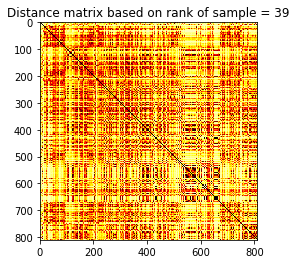

In [154]:
ranksToTry = range(2, 40)
dec = ["Distance matrix based on rank of sample = " + str(ranksToTry[i]) for i in range(0, len(ranksToTry))]
dissims = [createDissim(countReps, reduce = True, numComponents = ranksToTry[i]) for i in range(0, len(ranksToTry))]
for i in range(0, len(dissims)):
    plt.imshow(dissims[i], cmap = 'hot', interpolation = 'nearest')
    plt.title(dec[i])
    plt.show()


2 (811, 2)


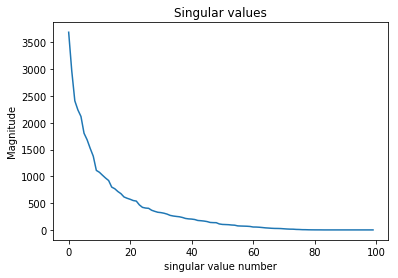

3 (811, 3)
4 (811, 4)
5 (811, 5)
6 (811, 6)
7 (811, 7)
8 (811, 8)
9 (811, 9)
10 (811, 10)
11 (811, 11)
12 (811, 12)
13 (811, 13)
14 (811, 14)
15 (811, 15)
16 (811, 16)
17 (811, 17)
18 (811, 18)
19 (811, 19)
20 (811, 20)
21 (811, 21)
22 (811, 22)
23 (811, 23)
24 (811, 24)
25 (811, 25)
26 (811, 26)
27 (811, 27)
28 (811, 28)
29 (811, 29)
30 (811, 30)
31 (811, 31)
32 (811, 32)
33 (811, 33)
34 (811, 34)
35 (811, 35)
36 (811, 36)
37 (811, 37)
38 (811, 38)
39 (811, 39)


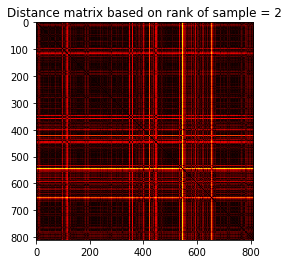

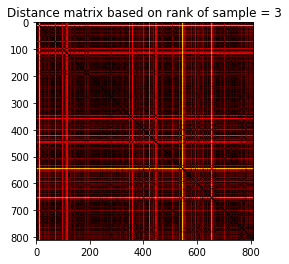

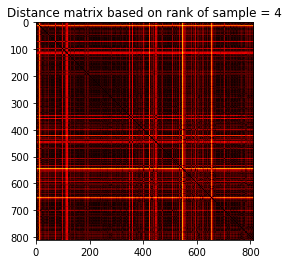

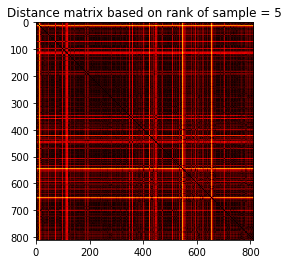

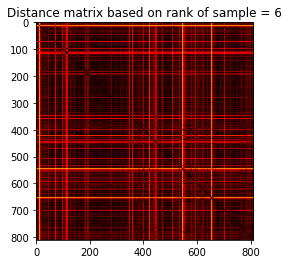

...

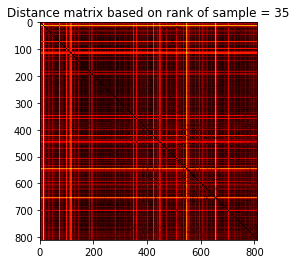

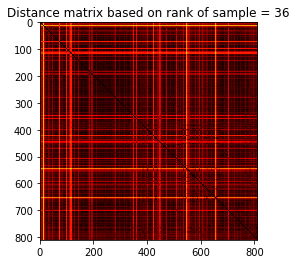

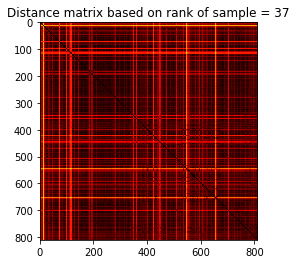

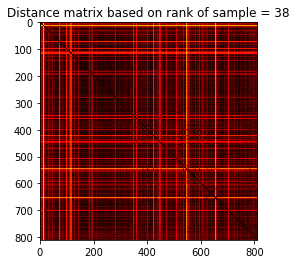

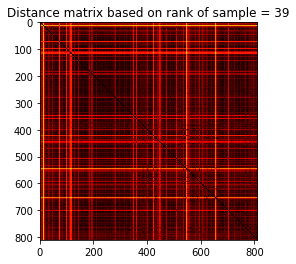

In [132]:
ranksToTry = range(2, 40)
dec = ["Distance matrix based on rank of sample = " + str(ranksToTry[i]) for i in range(0, len(ranksToTry))]
dissims = [createDissim(countReps, reduce = True, numComponents = ranksToTry[i], center = False) for i in range(0, len(ranksToTry))]
for i in range(0, len(dissims)):
    plt.imshow(dissims[i], cmap = 'hot', interpolation = 'nearest')
    plt.title(dec[i])
    plt.show()

It looks like a rank 10-20 rank approximation is enough to get all the details that are in the full-rank version. 

Further analysis (or reading!) needs to be done to understand why taking the elbow point of the singular values did not do a good job. 

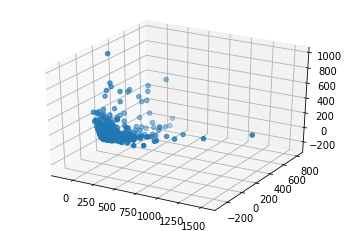

In [105]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

sampleMatrix = matrixify(countReps)
sampleMatrix, decomp = reduceCountsSVD(sampleMatrix, 3)
ax.scatter(sampleMatrix[:,0], sampleMatrix[:,1],sampleMatrix[:,2])
plt.show()

In [106]:
import random
def cluster_points(X, mu):
    clusters  = {}
    for x in X:
        bestmukey = min([(i[0], scipy.spatial.distance.cosine(x, mu[i[0]])) 
                    for i in enumerate(mu)], key=lambda t:t[1])[0]
        try:
            clusters[bestmukey].append(x)
        except KeyError:
            clusters[bestmukey] = [x]
    return clusters
 
def reevaluate_centers(mu, clusters):
    newmu = []
    keys = sorted(clusters.keys())
    for k in keys:
        newmu.append(np.mean(clusters[k], axis = 0))
    return newmu
 
def has_converged(mu, oldmu):
    return (set([tuple(a) for a in mu]) == set([tuple(a) for a in oldmu]))
 
            
            
def find_centers(X, K):
    # Initialize to K random centers
    #oldmu = random.sample(X, K)
    idx1 = np.random.randint(X.shape[0], size=K)
    idx2 = np.random.randint(X.shape[0], size=K)
    oldmu = X[idx1, :]
    mu = X[idx2, :]
   # mu = random.sample(X, K)
    while not has_converged(mu, oldmu):
        oldmu = mu
        # Assign all points in X to clusters
        clusters = cluster_points(X, mu)
        # Reevaluate centers
        mu = reevaluate_centers(oldmu, clusters)
    return(mu, clusters)


def Wk(mu, clusters):
    K = len(mu)
    return sum([np.linalg.norm(mu[i]-c)**2/(2*len(c)) 
    for i in range(K) for c in clusters[i]])



def bounding_box(X):
    xmin, xmax = min(X,key=lambda a:a[0])[0], max(X,key=lambda a:a[0])[0]
    ymin, ymax = min(X,key=lambda a:a[1])[1], max(X,key=lambda a:a[1])[1]
    return (xmin,xmax), (ymin,ymax)
 
def gap_statistic(X):
    (xmin,xmax), (ymin,ymax) = bounding_box(X)
    # Dispersion for real distribution
    ks = range(1,20)
    Wks = np.zeros((len(ks),))
    Wkbs = np.zeros((len(ks),))
    sk = np.zeros((len(ks),))
    for indk, k in enumerate(ks):
        mu, clusters = find_centers(X,k)
        Wks[indk] = np.log(Wk(mu, clusters))
        # Create B reference datasets
        B = 10
        BWkbs = np.zeros((B,))
        for i in range(B):
            Xb = []
            for n in range(len(X)):
                Xb.append([random.uniform(xmin,xmax),
                          random.uniform(ymin,ymax)])
            Xb = np.array(Xb)
            mu, clusters = find_centers(Xb,k)
            BWkbs[i] = np.log(Wk(mu, clusters))
        Wkbs[indk] = sum(BWkbs)/B
        sk[indk] = np.sqrt(sum((BWkbs-Wkbs[indk])**2)/B)
    sk = sk*np.sqrt(1+1/B)
    return(ks, Wks, Wkbs, sk)


In [107]:
reps = sampleMatrix = matrixify(countReps)
sampleMatrix, decomp = reduceCountsSVD(sampleMatrix, 20)
print("done here")
#ks, logWks, logWkbs, sk = gap_statistic(sampleMatrix)

done here


In [108]:
plt.plot(logWkbs - logWks)
plt.show()

NameError: name 'logWkbs' is not defined

Let's look at the rank of the distance matrix as well: 

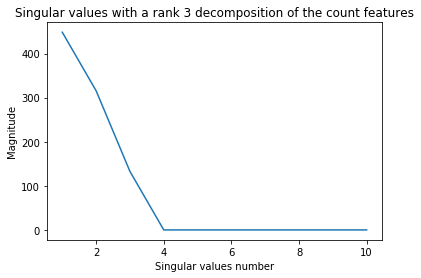

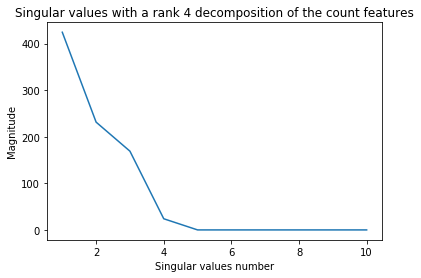

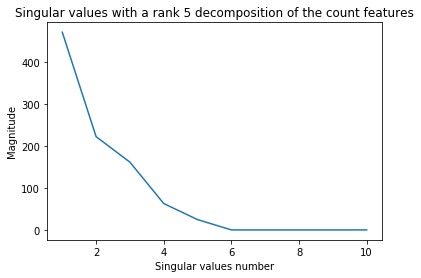

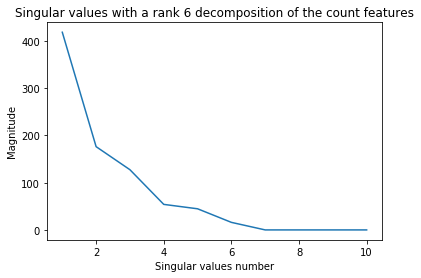

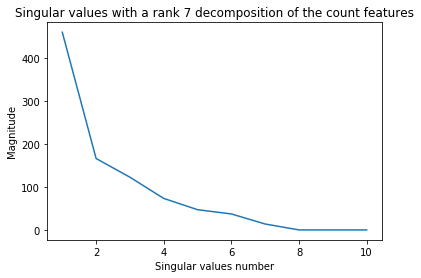

...

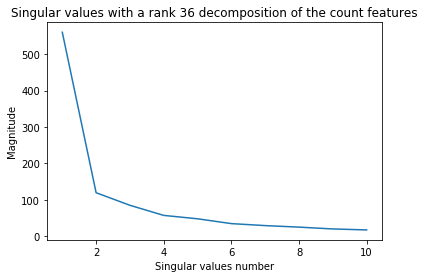

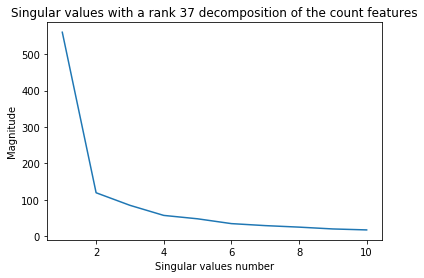

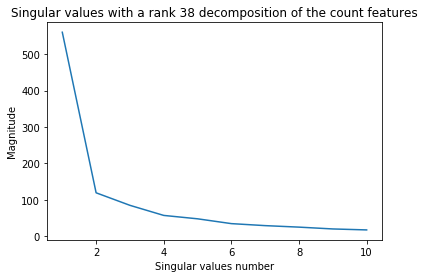

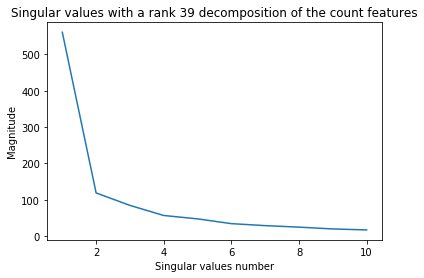

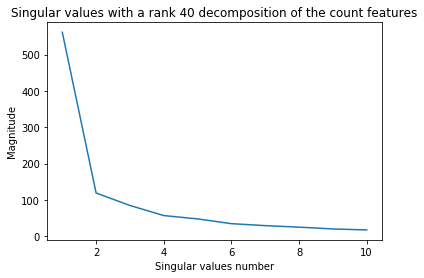

In [109]:
for i in range(0 ,len(dissims)): 
    dissim = dissims[i]
    u, s, vh = np.linalg.svd(dissim, full_matrices=True)
    plt.plot(range(1,11),s[:10])
    plt.title("Singular values with a rank " + str(i + 3) + " decomposition of the count features")
    plt.xlabel("Singular values number")
    plt.ylabel("Magnitude")
    plt.show()

In [111]:
sampleMatrix = matrixify(countReps)
probReps = sampleMatrix/sampleMatrix.sum(axis=1, keepdims=True)

In [112]:
u, s, vh = np.linalg.svd(probReps, full_matrices=True)
plt.plot(s[:50])
plt.show()

KeyboardInterrupt: 

In [114]:
import utils

In [115]:
def JSDDissim(probReps):
    dissim = scipy.spatial.distance.pdist(sampleMatrix, utils.JSD)
    return scipy.spatial.distance.squareform(dissim)

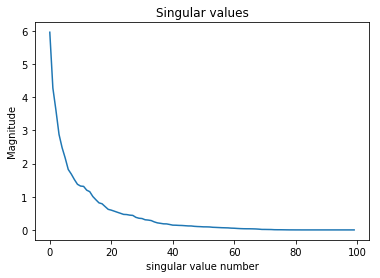

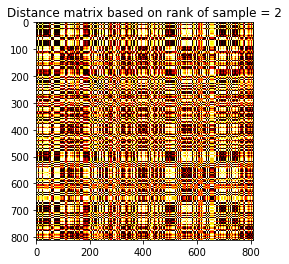

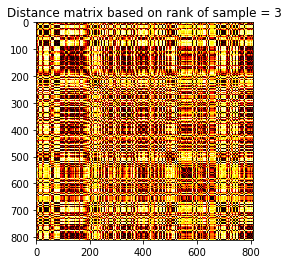

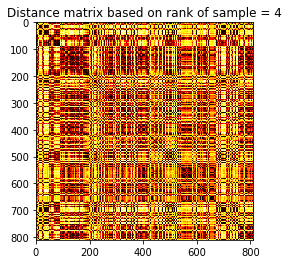

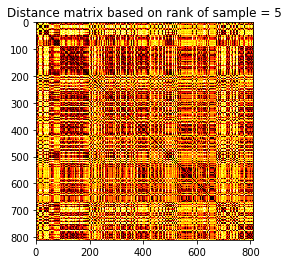

...

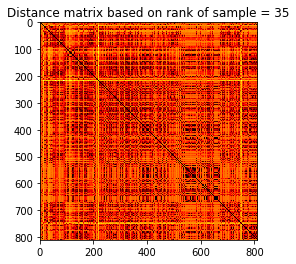

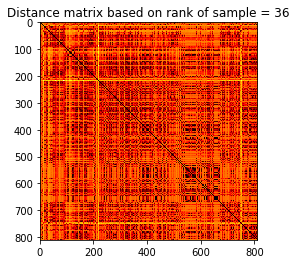

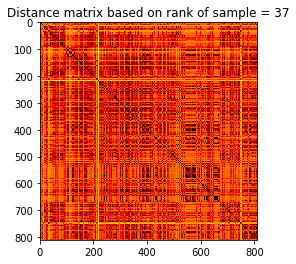

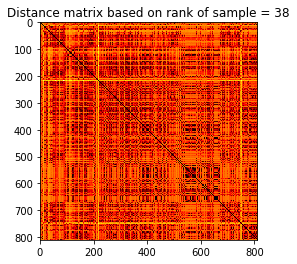

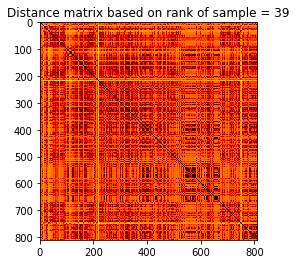

In [116]:
ranksToTry = range(2, 40)
dec = ["Distance matrix based on rank of sample = " + str(ranksToTry[i]) for i in range(0, len(ranksToTry))]
dissims = [createDissim(probReps, reduce = True, numComponents = ranksToTry[i]) for i in range(0, len(ranksToTry))]
for i in range(0, len(dissims)):
    plt.imshow(dissims[i], cmap = 'hot', interpolation = 'nearest')
    plt.title(dec[i])
    plt.show()
JSDDistanceMat = JSDDissim(probReps)

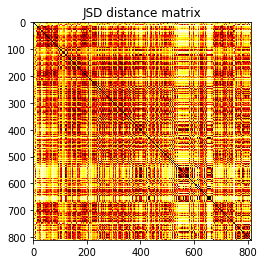

In [117]:
plt.imshow(JSDDistanceMat, cmap = "hot", interpolation = "nearest")
plt.title("JSD distance matrix")
plt.show()